# 01 — Inference Pipeline: Detection, Segmentation & Pose

**Capstone deliverable 1 (25 pts)** — *Core Vision Tasks & Inference*.

This notebook runs the Ultralytics Python API (`model.predict`) over **real construction-site
photographs** (Wikimedia Commons, CC-licensed — see `logs/01_assets_download.log`) and covers:

1. **Object detection** with `yolo11n.pt` — locate every worker (COCO class `person`).
2. **Instance segmentation** with `yolo11n-seg.pt` — pixel-accurate worker masks *(beyond detection #1)*.
3. **Pose estimation** with `yolo11n-pose.pt` — 17-keypoint worker skeletons *(beyond detection #2)*.
4. A **PPE gap analysis**: why helmet compliance needs the custom model trained in `03_train_eval.ipynb`.

All annotated evidence images are written to `outputs/`.

In [1]:
import os
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import ultralytics
from ultralytics import YOLO

ultralytics.checks()

ROOT = Path.cwd()
while not (ROOT / 'data').exists():
    ROOT = ROOT.parent
IMG_DIR = ROOT / 'data' / 'images'
OUT_DIR = ROOT / 'outputs'
OUT_DIR.mkdir(exist_ok=True)

Ultralytics 8.4.129  Python-3.11.15 torch-2.13.0+cpu CPU (Intel Core i7-10510U 1.80GHz)


Setup complete  (8 CPUs, 15.8 GB RAM, 164.5/459.0 GB disk)


## 1 — The input data: real construction sites

Eight real site photographs fetched by `scripts/download_assets.py`. They include workers
**with** helmets (sites 01, 03, 05), workers in hi-vis without helmets (site 07), and
challenging scenes (night break room, distant crane workers) to probe model robustness.

Found 8 real construction-site images:
  site_01.jpg  (423 KB)
  site_02.jpg  (610 KB)
  site_03.jpg  (957 KB)
  site_04.jpg  (1392 KB)
  site_05.jpg  (636 KB)
  site_06.jpg  (683 KB)
  site_07.jpg  (843 KB)
  site_08.jpg  (445 KB)


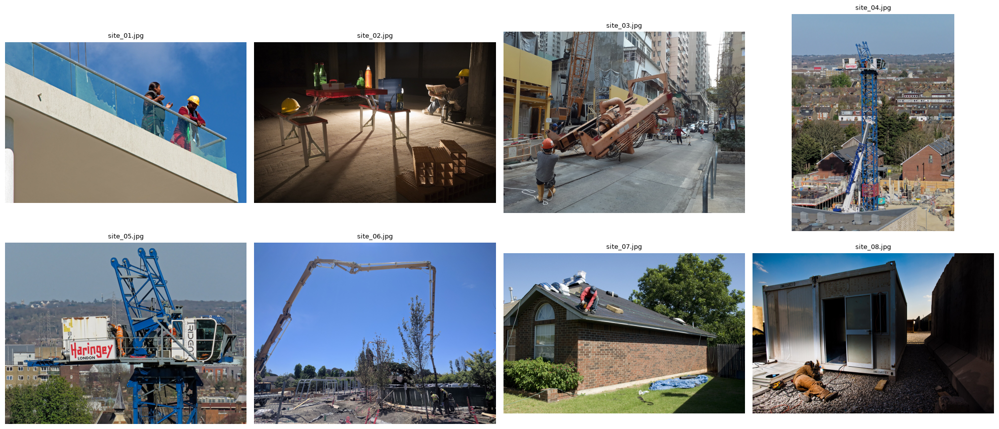

In [2]:
image_paths = sorted(IMG_DIR.glob('*.jpg'))
print(f'Found {len(image_paths)} real construction-site images:')
for p in image_paths:
    print(f'  {p.name}  ({p.stat().st_size/1024:.0f} KB)')

fig, axes = plt.subplots(2, 4, figsize=(20, 9))
for ax, p in zip(axes.ravel(), image_paths):
    img = cv2.imdecode(np.fromfile(str(p), dtype=np.uint8), cv2.IMREAD_COLOR)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(p.name, fontsize=9)
    ax.axis('off')
plt.tight_layout()
plt.show()

## 2 — Object detection (`yolo11n.pt`, COCO-pretrained)

Detection is filtered to `classes=[0]` (person) because PPE compliance monitoring starts
from knowing **where every worker is**. Confidence gate: `conf=0.25`.

In [3]:
det_model = YOLO('yolo11n.pt')

rows = []
results_by_image = {}
for p in image_paths:
    results = det_model.predict(source=str(p), classes=[0], conf=0.25, verbose=True)
    r = results[0]
    results_by_image[p.name] = r
    confs = [float(c) for c in r.boxes.conf]
    rows.append({
        'image': p.name,
        'persons_detected': len(r.boxes),
        'mean_conf': round(float(np.mean(confs)), 3) if confs else None,
        'max_conf': round(float(np.max(confs)), 3) if confs else None,
    })

det_summary = pd.DataFrame(rows)
det_summary

image 1/1 C:\Users\ksama\OneDrive\\projects\OpenCode\construction-helmet-detection\data\images\site_01.jpg: 448x640 2 persons, 205.4ms


Speed: 8.5ms preprocess, 205.4ms inference, 7.1ms postprocess per image at shape (1, 3, 448, 640)


image 1/1 C:\Users\ksama\OneDrive\\projects\OpenCode\construction-helmet-detection\data\images\site_02.jpg: 448x640 1 person, 120.9ms


Speed: 75.1ms preprocess, 120.9ms inference, 2.3ms postprocess per image at shape (1, 3, 448, 640)


image 1/1 C:\Users\ksama\OneDrive\\projects\OpenCode\construction-helmet-detection\data\images\site_03.jpg: 480x640 2 persons, 163.4ms


Speed: 6.0ms preprocess, 163.4ms inference, 4.2ms postprocess per image at shape (1, 3, 480, 640)


image 1/1 C:\Users\ksama\OneDrive\\projects\OpenCode\construction-helmet-detection\data\images\site_04.jpg: 640x480 (no detections), 189.0ms


Speed: 7.7ms preprocess, 189.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


image 1/1 C:\Users\ksama\OneDrive\\projects\OpenCode\construction-helmet-detection\data\images\site_05.jpg: 480x640 (no detections), 131.9ms


Speed: 5.9ms preprocess, 131.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


image 1/1 C:\Users\ksama\OneDrive\\projects\OpenCode\construction-helmet-detection\data\images\site_06.jpg: 480x640 2 persons, 136.0ms


Speed: 6.0ms preprocess, 136.0ms inference, 2.7ms postprocess per image at shape (1, 3, 480, 640)


image 1/1 C:\Users\ksama\OneDrive\\projects\OpenCode\construction-helmet-detection\data\images\site_07.jpg: 448x640 1 person, 133.1ms


Speed: 4.8ms preprocess, 133.1ms inference, 2.3ms postprocess per image at shape (1, 3, 448, 640)


image 1/1 C:\Users\ksama\OneDrive\\projects\OpenCode\construction-helmet-detection\data\images\site_08.jpg: 448x640 (no detections), 120.3ms


Speed: 4.8ms preprocess, 120.3ms inference, 2.4ms postprocess per image at shape (1, 3, 448, 640)


,image,persons_detected,mean_conf,max_conf
0,site_01.jpg,2,0.830,0.841
1,site_02.jpg,1,0.587,0.587
2,site_03.jpg,2,0.789,0.853
3,site_04.jpg,0,NaN,NaN
4,site_05.jpg,0,NaN,NaN
5,site_06.jpg,2,0.256,0.261
6,site_07.jpg,1,0.735,0.735
7,site_08.jpg,0,NaN,NaN


saved 01_detect_site_01.jpg: 2 person boxes


saved 01_detect_site_03.jpg: 2 person boxes
saved 01_detect_site_07.jpg: 1 person boxes


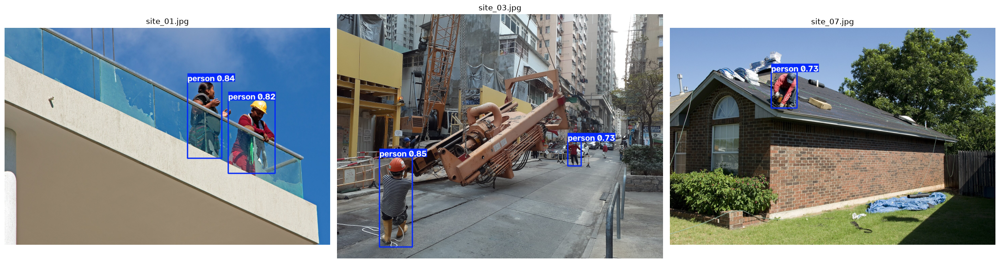

In [4]:
showcase = ['site_01.jpg', 'site_03.jpg', 'site_07.jpg']
for name in showcase:
    r = results_by_image[name]
    out = OUT_DIR / f'01_detect_{name}'
    r.save(filename=str(out))
    print(f'saved {out.name}: {len(r.boxes)} person boxes')

fig, axes = plt.subplots(1, 3, figsize=(22, 7))
for ax, name in zip(axes, showcase):
    img = cv2.imdecode(np.fromfile(str(OUT_DIR / f'01_detect_{name}'), dtype=np.uint8), cv2.IMREAD_COLOR)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(name)
    ax.axis('off')
plt.tight_layout()
plt.show()

## 3 — Beyond detection #1: instance segmentation (`yolo11n-seg.pt`)

Segmentation gives pixel-accurate worker silhouettes instead of rectangles. On a site this
supports zone-intrusion analytics (is the worker's *body* inside the exclusion zone?) and
cleaner occlusion handling between adjacent workers.

image 1/1 C:\Users\ksama\OneDrive\\projects\OpenCode\construction-helmet-detection\data\images\site_03.jpg: 480x640 2 persons, 211.4ms


Speed: 6.5ms preprocess, 211.4ms inference, 9.5ms postprocess per image at shape (1, 3, 480, 640)


site_03.jpg: masks tensor (2, 480, 640) -> 2 person instances, 218 polygon vertices total


image 1/1 C:\Users\ksama\OneDrive\\projects\OpenCode\construction-helmet-detection\data\images\site_01.jpg: 448x640 2 persons, 255.9ms


Speed: 8.8ms preprocess, 255.9ms inference, 8.8ms postprocess per image at shape (1, 3, 448, 640)


site_01.jpg: masks tensor (2, 448, 640) -> 2 person instances, 367 polygon vertices total


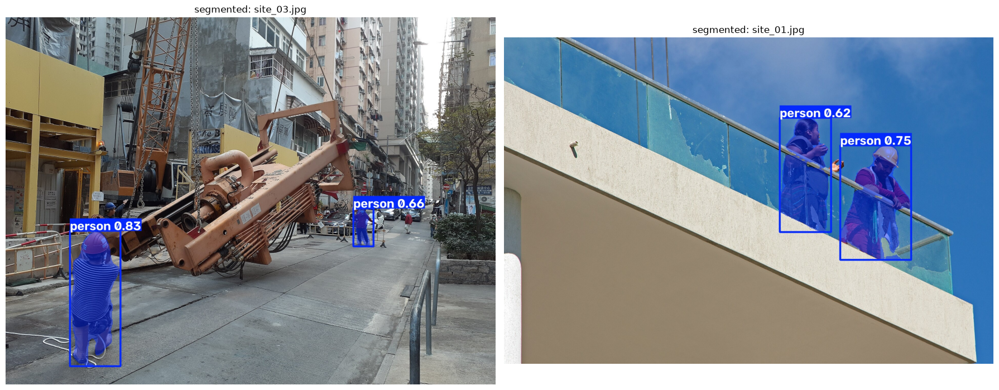

In [5]:
seg_model = YOLO('yolo11n-seg.pt')

seg_names = ['site_03.jpg', 'site_01.jpg']
for name in seg_names:
    r = seg_model.predict(source=str(IMG_DIR / name), classes=[0], conf=0.25, verbose=True)[0]
    n_masks = 0 if r.masks is None else len(r.masks)
    poly_pts = 0 if r.masks is None else sum(len(xy) for xy in r.masks.xy)
    shape = None if r.masks is None else tuple(r.masks.data.shape)
    print(f'{name}: masks tensor {shape} -> {n_masks} person instances, '
          f'{poly_pts} polygon vertices total')
    r.save(filename=str(OUT_DIR / f'01_seg_{name}'))

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
for ax, name in zip(axes, seg_names):
    img = cv2.imdecode(np.fromfile(str(OUT_DIR / f'01_seg_{name}'), dtype=np.uint8), cv2.IMREAD_COLOR)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f'segmented: {name}')
    ax.axis('off')
plt.tight_layout()
plt.show()

## 4 — Beyond detection #2: pose estimation (`yolo11n-pose.pt`)

Pose yields 17 body keypoints per worker. Safety-relevant uses: detecting bent/crouched
postures in lifting operations, raised-arm danger gestures, or workers climbing where
they should not.

image 1/1 C:\Users\ksama\OneDrive\\projects\OpenCode\construction-helmet-detection\data\images\site_01.jpg: 448x640 2 persons, 163.0ms


Speed: 5.6ms preprocess, 163.0ms inference, 2.3ms postprocess per image at shape (1, 3, 448, 640)


site_01.jpg: 2 worker skeletons, keypoints tensor (2, 17, 3)



image 1/1 C:\Users\ksama\OneDrive\\projects\OpenCode\construction-helmet-detection\data\images\site_03.jpg: 480x640 1 person, 173.5ms


Speed: 6.2ms preprocess, 173.5ms inference, 3.3ms postprocess per image at shape (1, 3, 480, 640)


site_03.jpg: 1 worker skeletons, keypoints tensor (1, 17, 3)



image 1/1 C:\Users\ksama\OneDrive\\projects\OpenCode\construction-helmet-detection\data\images\site_07.jpg: 448x640 1 person, 134.3ms


Speed: 5.6ms preprocess, 134.3ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)


site_07.jpg: 1 worker skeletons, keypoints tensor (1, 17, 3)


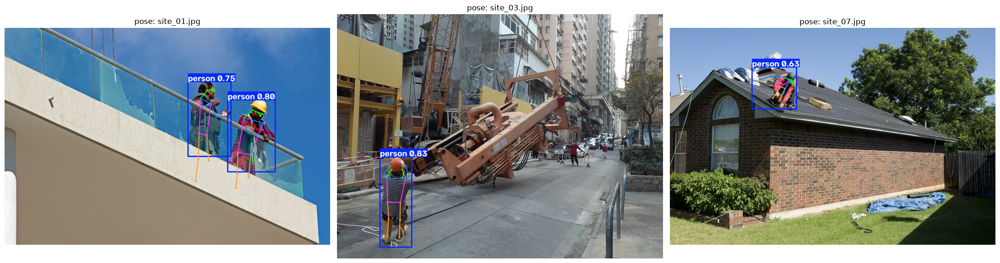

In [6]:
pose_model = YOLO('yolo11n-pose.pt')

pose_names = ['site_01.jpg', 'site_03.jpg', 'site_07.jpg']
for name in pose_names:
    r = pose_model.predict(source=str(IMG_DIR / name), conf=0.25, verbose=True)[0]
    n = 0 if r.keypoints is None else len(r.keypoints)
    shape = None if r.keypoints is None else tuple(r.keypoints.data.shape)
    print(f'{name}: {n} worker skeletons, keypoints tensor {shape}')
    r.save(filename=str(OUT_DIR / f'01_pose_{name}'))

fig, axes = plt.subplots(1, 3, figsize=(22, 7))
for ax, name in zip(axes, pose_names):
    img = cv2.imdecode(np.fromfile(str(OUT_DIR / f'01_pose_{name}'), dtype=np.uint8), cv2.IMREAD_COLOR)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f'pose: {name}')
    ax.axis('off')
plt.tight_layout()
plt.show()

## 5 — PPE gap analysis: why a custom helmet model is required

The COCO label space has no helmet class. A pretrained detector can find workers but can
**never** decide whether a worker is compliant — the core capability of this project.
That is exactly why deliverable 3 fine-tunes a custom helmet/head detector on a labeled
PPE dataset.

In [7]:
coco_names = det_model.names
helmet_like = [n for n in coco_names.values() if 'helmet' in n or 'hat' in n]
print(f'COCO class count: {len(coco_names)}')
print(f'Helmet-related classes in COCO: {helmet_like if helmet_like else "NONE"}')
print()
print('=> Pretrained models locate workers but cannot verify helmet compliance.')
print('=> 03_train_eval.ipynb fine-tunes a custom helmet detector to close this gap.')
det_summary

COCO class count: 80
Helmet-related classes in COCO: NONE

=> Pretrained models locate workers but cannot verify helmet compliance.
=> 03_train_eval.ipynb fine-tunes a custom helmet detector to close this gap.


,image,persons_detected,mean_conf,max_conf
0,site_01.jpg,2,0.830,0.841
1,site_02.jpg,1,0.587,0.587
2,site_03.jpg,2,0.789,0.853
3,site_04.jpg,0,NaN,NaN
4,site_05.jpg,0,NaN,NaN
5,site_06.jpg,2,0.256,0.261
6,site_07.jpg,1,0.735,0.735
7,site_08.jpg,0,NaN,NaN


## 6 — Evidence produced by this notebook

In [8]:
print('Annotated evidence files:')
for f in sorted(OUT_DIR.glob('01_*')):
    print(f'  {f.name}  ({f.stat().st_size/1024:.0f} KB)')

Annotated evidence files:
  01_detect_site_01.jpg  (679 KB)
  01_detect_site_03.jpg  (1421 KB)
  01_detect_site_07.jpg  (1250 KB)
  01_pose_site_01.jpg  (688 KB)
  01_pose_site_03.jpg  (1424 KB)
  01_pose_site_07.jpg  (1250 KB)
  01_seg_site_01.jpg  (664 KB)
  01_seg_site_03.jpg  (1413 KB)
